# Modelo de previsão de Instabilidade de fluxo em linhas de produção de petróleo e gás *Off-shore*

# Importando bibliotecas

In [1]:
import os
import gc

import pandas as pd
import numpy as np
import missingno
import glob

import matplotlib.pyplot as plt
import seaborn as sns

# Carregando o banco de dados e as Tags das variáveis

In [2]:
tags = {'P-PDG':'Pa', 
        'P-TPT':'Pa', 'T-TPT':'°C',
         'P-MON-CKP':'Pa', 'T-JUS-CKP':'°C', 
         'P-JUS-CKGL':'Pa', 'T-JUS-CKGL':'°C',
         'QGL': 'm³/s'}

var = ['Pressão na PDG (Medidor de fundo)',
         'Pressão no TPT (Transdutor de temp. e pressão)',
         'Temperatura no TPT (Transdutor de temp. e pressão)',
         'Pressão upstream na PCK (Válvula choke de produção)',
         'Temperatura downstream na PCK (Válvula choke de produção)',
         'Pressão downstream na GLCK (Gás lift)',
         'Temperatura downstream na GLCK (Gás lift)',
         'Vazão do Gas lift']

reference_table = pd.DataFrame(index=np.arange(1,len(var)+1))
reference_table.index.name='Variável'
reference_table['Tag'] = tags.keys()
reference_table['Nome'] = var
reference_table['Unidades'] = tags.values()
reference_table

,Tag,Nome,Unidades
Variável,,,
1,P-PDG,Pressão na PDG (Medidor de fundo),Pa
2,P-TPT,Pressão no TPT (Transdutor de temp. e pressão),Pa
3,T-TPT,Temperatura no TPT (Transdutor de temp. e pres...,°C
4,P-MON-CKP,Pressão upstream na PCK (Válvula choke de prod...,Pa
5,T-JUS-CKP,Temperatura downstream na PCK (Válvula choke d...,°C
6,P-JUS-CKGL,Pressão downstream na GLCK (Gás lift),Pa
7,T-JUS-CKGL,Temperatura downstream na GLCK (Gás lift),°C
8,QGL,Vazão do Gas lift,m³/s


### Carregando o banco de dados sem falha (normal)

In [3]:
%%time
EVENT = 0

PATH = f'/kaggle/input/3w-dataset/3W/{EVENT}/'


files = [f for f in os.listdir(PATH) if os.path.isfile(os.path.join(PATH, f))]
files

dfs = {}

for file in files:
    
    dfs[file[:-4]] = pd.read_csv(f'{PATH}/{file}', index_col = 0,
                     parse_dates = True).rename_axis(None)

        
print("Número de instâncias total:", len(dfs))

Número de instâncias total: 597
CPU times: user 15.5 s, sys: 3.02 s, total: 18.5 s
Wall time: 36.7 s


In [4]:
%%time

dados_normal = pd.DataFrame()

file_list = glob.glob(PATH + "/*.csv")
id_poco = []

for i in range(0,(len(file_list))):
    if ('WELL' in file_list[i]) and ((('01') in file_list[i][38:40]) or (('02') in file_list[i][38:40])
                                    or (('04') in file_list[i][38:40]) or (('05') in file_list[i][38:40])
                                    or (('07') in file_list[i][38:40])):
        reais = pd.read_table(file_list[i], sep = ',')
        df = pd.DataFrame(reais)
        df['Id_poco'] = file_list[i][38:40]
        dados_normal= pd.concat([dados_normal, df], axis = 0, ignore_index = True)
        id_poco.append(file_list[i][38:40])

well_list = set(id_poco)


print("Número de poços investigado:", len(well_list))

Número de poços investigado: 5
CPU times: user 59.1 s, sys: 29.6 s, total: 1min 28s
Wall time: 1min 29s


In [5]:
well_list

{'01', '02', '04', '05', '07'}

In [6]:
dados_normal

,timestamp,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,T-JUS-CKGL,QGL,class,Id_poco
0,2014-08-07 16:03:11.000000,0.0,17734130.0,106.4384,9527408.0,68.04015,NaN,NaN,NaN,0,04
1,2014-08-07 16:03:12.000000,0.0,17734340.0,106.4384,9524757.0,68.02015,NaN,NaN,NaN,0,04
2,2014-08-07 16:03:13.000000,0.0,17734550.0,106.4384,9522105.0,68.00014,NaN,NaN,NaN,0,04
3,2014-08-07 16:03:14.000000,0.0,17734760.0,106.4384,9519454.0,67.98015,NaN,NaN,NaN,0,04
4,2014-08-07 16:03:15.000000,0.0,17734970.0,106.4384,9516803.0,67.96014,NaN,NaN,NaN,0,04
...,...,...,...,...,...,...,...,...,...,...,...
6426718,2017-05-27 20:56:56.000000,0.0,14226940.0,116.6883,6129552.0,69.03078,3019204.0,NaN,0.0,0,01
6426719,2017-05-27 20:56:57.000000,0.0,14226980.0,116.6877,6129674.0,69.03046,3019204.0,NaN,0.0,0,01
6426720,2017-05-27 20:56:58.000000,0.0,14227020.0,116.6870,6129795.0,69.03015,3019203.0,NaN,0.0,0,01
6426721,2017-05-27 20:56:59.000000,0.0,14227060.0,116.6864,6129917.0,69.02983,3019203.0,NaN,0.0,0,01


### Carregando o banco de dados com falha (Instabilidade de fluxo)

In [7]:
%%time
EVENT = 4

PATH = f'/kaggle/input/3w-dataset/3W/{EVENT}/'


files = [f for f in os.listdir(PATH) if os.path.isfile(os.path.join(PATH, f))]
files

dfs1 = {}

for file in files:
    
    dfs1[file[:-4]] = pd.read_csv(f'{PATH}/{file}', index_col = 0,
                     parse_dates = True).rename_axis(None)



print("Número de instâncias total:", len(dfs1))

Número de instâncias total: 344
CPU times: user 4.24 s, sys: 296 ms, total: 4.54 s
Wall time: 8.42 s


In [8]:
%%time

dados_falha = pd.DataFrame()

file_list1 = glob.glob(PATH + "/*.csv")
id_poco_falha = []

for i in range(0,(len(file_list1))):
    if ('WELL' in file_list1[i]) and ((('01') in file_list1[i][38:40]) or (('02') in file_list1[i][38:40])
                                    or (('04') in file_list1[i][38:40]) or (('05') in file_list1[i][38:40])
                                    or (('07') in file_list1[i][38:40])):
        reais = pd.read_table(file_list1[i], sep = ',')
        df1 = pd.DataFrame(reais)
        df1['Id_poco'] = file_list1[i][38:40]
        id_poco_falha.append(file_list1[i][38:40])
        dados_falha = pd.concat([dados_falha, df1], axis = 0, ignore_index = True)

well_list_fault = set(id_poco_falha)


print("Número de poços investigado:", len(well_list_fault))

Número de poços investigado: 5
CPU times: user 9.74 s, sys: 2.54 s, total: 12.3 s
Wall time: 12.4 s


In [9]:
well_list_fault

{'01', '02', '04', '05', '07'}

### Juntando os dois banco de dados

In [10]:
dados_total = pd.DataFrame()
dados_total = pd.concat([dados_normal, dados_falha], axis = 0, ignore_index = True)

In [11]:
dados_total.shape

(8146631, 11)

# Análise de dados

## Verificando o tipo de dado de cada uma das colunas

In [12]:
dados_total.dtypes

timestamp      object
P-PDG         float64
P-TPT         float64
T-TPT         float64
P-MON-CKP     float64
T-JUS-CKP     float64
P-JUS-CKGL    float64
T-JUS-CKGL    float64
QGL           float64
class           int64
Id_poco        object
dtype: object

In [13]:
dados_total['Id_poco'] = dados_total['Id_poco'].astype(str).astype(int)

## Alterando o tipo de dado para *Datetime*

In [14]:
dados_total['Id_poco'].unique()

array([4, 5, 1, 2, 7])

In [15]:
dados_total['timestamp'] = pd.to_datetime(dados_total['timestamp'])
dados_total_2 = pd.DataFrame(dados_total)
dados_total_2 = dados_total_2.set_index(['timestamp'])
dados_total_2

,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,T-JUS-CKGL,QGL,class,Id_poco
timestamp,,,,,,,,,,
2014-08-07 16:03:11,0.0,17734130.0,106.4384,9527408.0,68.04015,NaN,NaN,NaN,0,4
2014-08-07 16:03:12,0.0,17734340.0,106.4384,9524757.0,68.02015,NaN,NaN,NaN,0,4
2014-08-07 16:03:13,0.0,17734550.0,106.4384,9522105.0,68.00014,NaN,NaN,NaN,0,4
2014-08-07 16:03:14,0.0,17734760.0,106.4384,9519454.0,67.98015,NaN,NaN,NaN,0,4
2014-08-07 16:03:15,0.0,17734970.0,106.4384,9516803.0,67.96014,NaN,NaN,NaN,0,4
...,...,...,...,...,...,...,...,...,...,...
2017-06-25 07:59:56,0.0,20772740.0,106.0728,11853160.0,66.77367,NaN,NaN,NaN,4,5
2017-06-25 07:59:57,0.0,20772160.0,106.0818,11857100.0,66.78676,NaN,NaN,NaN,4,5
2017-06-25 07:59:58,0.0,20771590.0,106.0908,11861040.0,66.79985,NaN,NaN,NaN,4,5


Os dados de séries temporais mostram que a amostragem foi feita a cada 1s.

## Analisando dados faltantes com a biblioteca *missingno*

<AxesSubplot:>

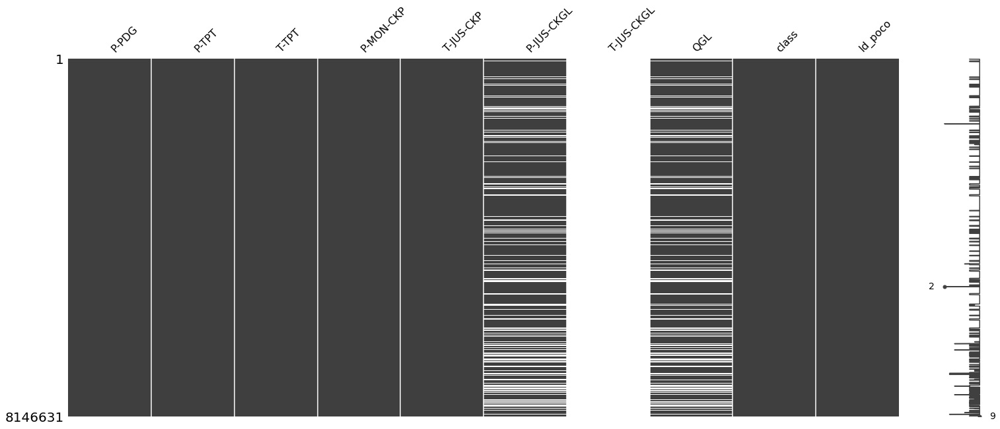

In [16]:
missingno.matrix(dados_total_2)

<AxesSubplot:>

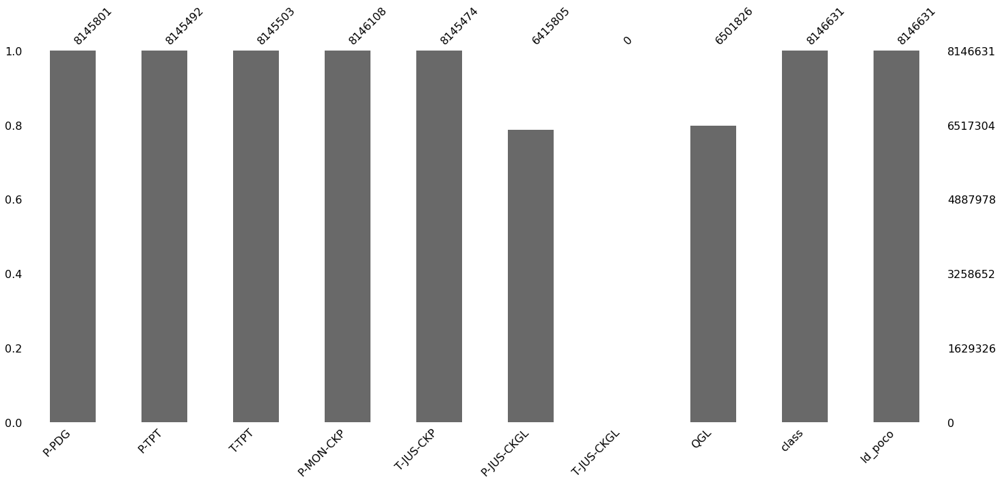

In [17]:
missingno.bar(dados_total_2)

As variáveis **'P-JUS-CKGL'**, **'T-JUS-CKGL'** e **'QGL'** seram excluidas por apresentarem muitos valores faltantes.

## Excluindo colunas vazias

In [18]:
dados_total_2.drop(['P-JUS-CKGL','T-JUS-CKGL','QGL'], axis=1, inplace=True)
dados_total_2.dropna(axis =0, inplace = True)

In [19]:
dados_total_2.shape
print('\n O banco de dados possui', dados_total_2.shape[0], 'linhas e', dados_total_2.shape[1], 'colunas.')


 O banco de dados possui 8145043 linhas e 7 colunas.


## Verificando a correlação entre as variáveis pelo *Heatmap*

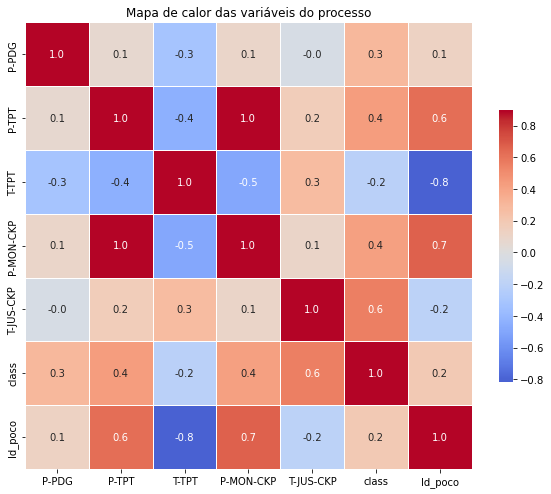

In [20]:
corre = dados_total_2.corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corre, annot= True, cmap= 'coolwarm', vmax=.9, center=0,
            square=True, linewidths=.5, fmt= '.1f', cbar_kws={"shrink": .5})
plt.title("Mapa de calor das variáveis do processo")
plt.show()

A variáveis que mais contribuem para que a instabilidade de fluxo ocorra nos poços de petróleo são a **T-JUS-CKP**, **P-MON-CKP** e **P-TPT**.

## Verificando a presença de *outliers* utilizando o gráfico de *Boxplot*

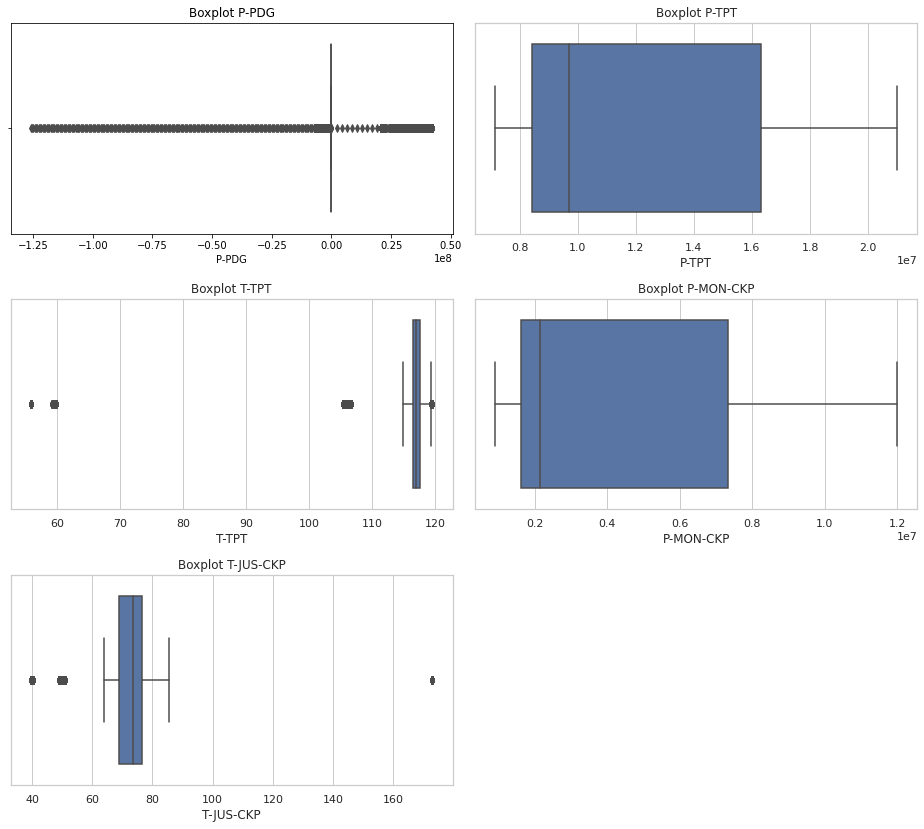

In [21]:
df_1 = dados_total[['P-PDG','P-TPT', 'T-TPT', 'P-MON-CKP','T-JUS-CKP']]
plt.figure(figsize=(13,15))

for i,cat in enumerate(df_1):
    plt.subplot(4,2,i+1)
    sns.set_theme(style="whitegrid")
    sns.boxplot(x=cat, data=dados_total)
    plt.title("Boxplot {}".format(cat))
plt.tight_layout()
plt.show()

É possível visualizar pelos gráficos de *Boxplot* que existe a presença de muitos valores 0's para a variável **P-PDG**.

As variáveis **T-TPT** e **T-JUS-CKP**, apresentam *outliers*.

# Visualizando o comportamento das variáveis com e sem falha (Poço 01)

**Aqui faremos uma análise dos dados do Poço 01, com dados do poço escoando fluidos em regime normal e com instabilidade no fluxo (falha).**

**Ambos os conjuntos de dados foram registrados no dia 21/04/2017**

In [22]:
poco_01_falha = pd.read_csv(f'/kaggle/input/3w-dataset/3W/4/WELL-00001_20170421160000.csv', 
                    index_col = 0, parse_dates = True).rename_axis(None)
poco_01_falha.drop(['P-JUS-CKGL','T-JUS-CKGL','QGL'], axis=1, inplace=True)
poco_01_falha.dropna(axis =0, inplace = True)



poco_01_normal = pd.read_csv(f'/kaggle/input/3w-dataset/3W/0/WELL-00001_20170421100251.csv', 
                    index_col = 0, parse_dates = True).rename_axis(None)
poco_01_normal.drop(['P-JUS-CKGL','T-JUS-CKGL','QGL'], axis=1, inplace=True)
poco_01_normal.dropna(axis =0, inplace = True)

## Verificando a distribuição dos dados através de histogramas e curva de densidade

### Dados do poço em regime normal

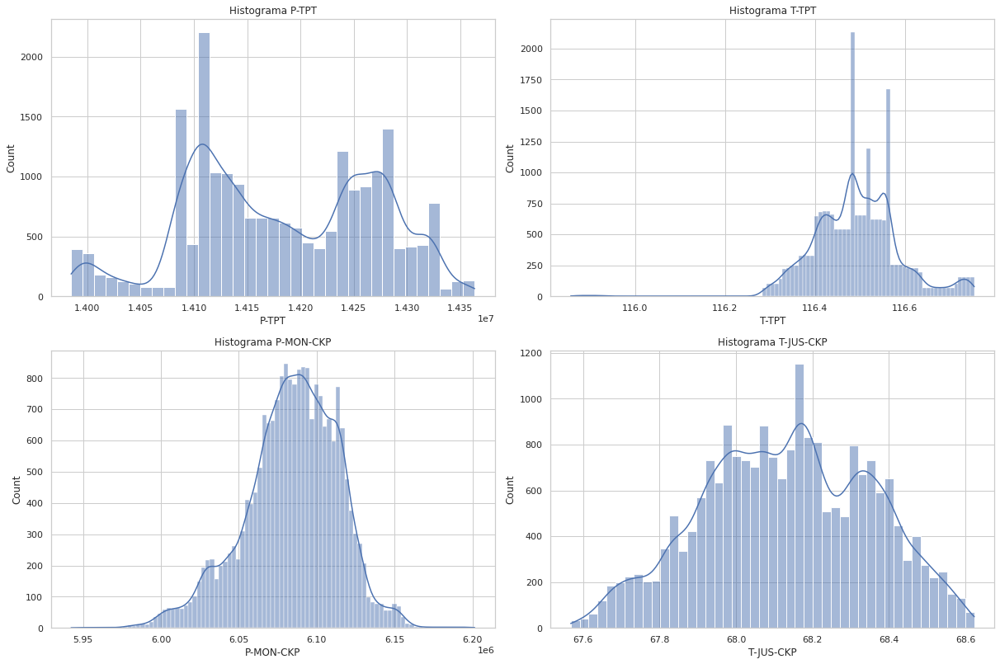

In [23]:
df_1 = poco_01_normal[['P-TPT', 'T-TPT', 'P-MON-CKP','T-JUS-CKP']]

plt.figure(figsize=(17,22))

for i,cat in enumerate(df_1):
    plt.subplot(4,2,i+1)
    sns.set_theme(style="whitegrid")
    sns.histplot(data=poco_01_normal, x= cat, kde = True)
    plt.title("Histograma {}".format(cat))
plt.tight_layout()
plt.show()

### Dados do poço em falha

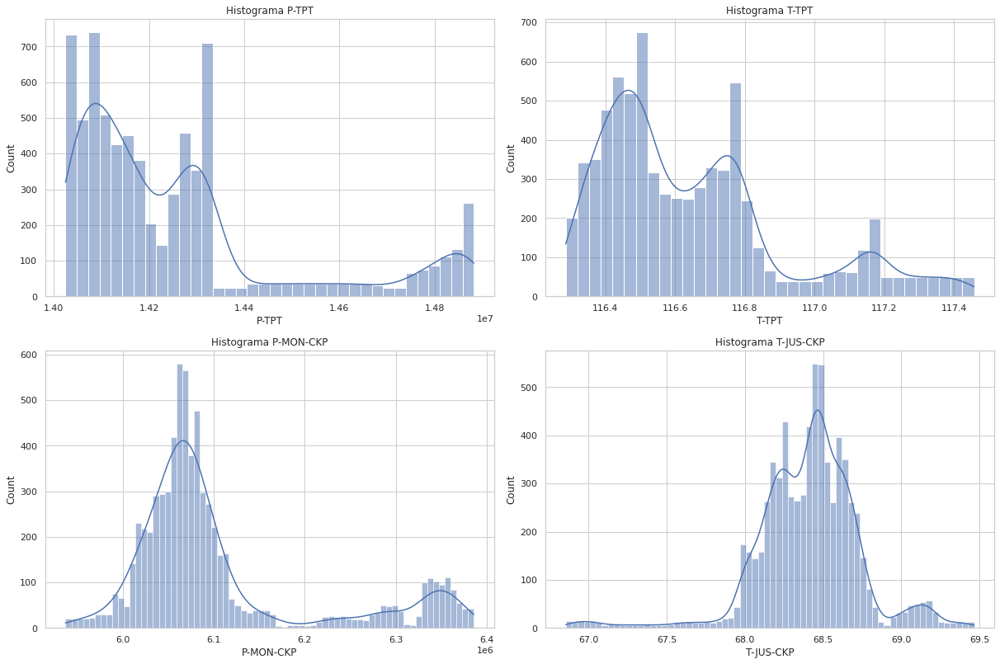

In [24]:
df_1 = poco_01_falha[['P-TPT', 'T-TPT', 'P-MON-CKP','T-JUS-CKP']]

plt.figure(figsize=(17,22))

for i,cat in enumerate(df_1):
    plt.subplot(4,2,i+1)
    sns.set_theme(style="whitegrid")
    sns.histplot(data=poco_01_falha, x= cat, kde = True)
    plt.title("Histograma {}".format(cat))
plt.tight_layout()
plt.show()

## Visualização do comportamento das variáveis em função do tempo para estado normal e estado de falha

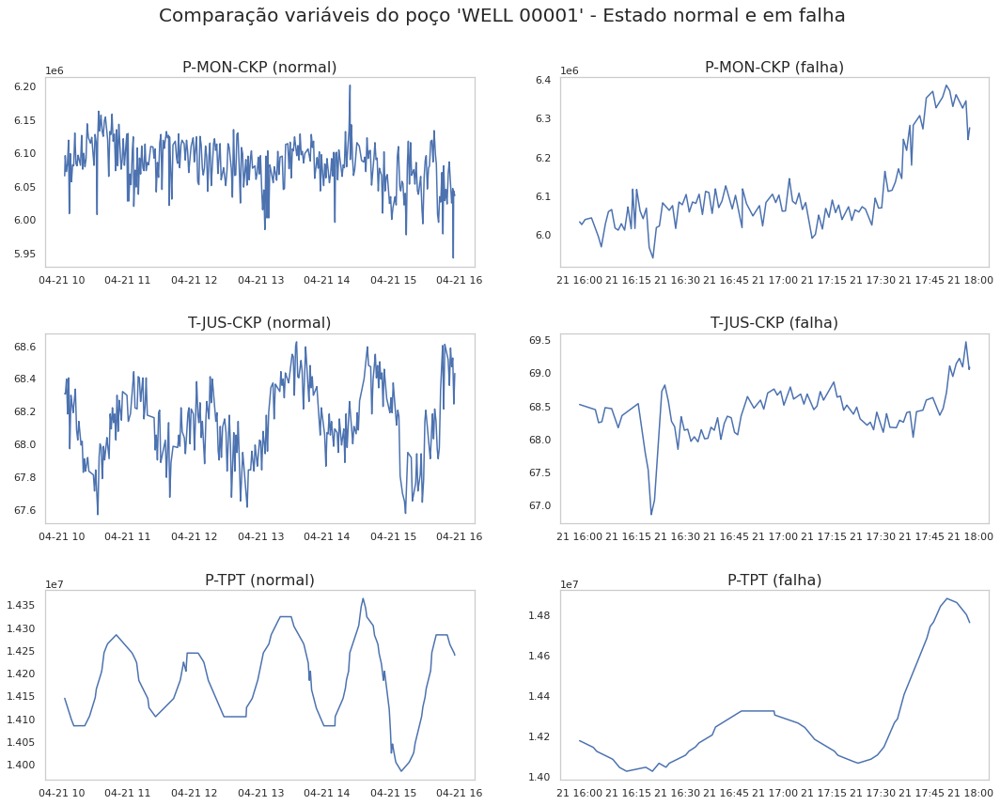

In [25]:
plt.figure(figsize = ((18, 13)))

plt.subplot(3, 2, 1)
plt.grid(visible=None)
plt.plot(poco_01_normal['P-MON-CKP'])
plt.title("P-MON-CKP (normal)", fontsize = 16)

plt.subplot(3, 2, 2)
plt.grid(visible=None)
plt.plot(poco_01_falha['P-MON-CKP'])
plt.title("P-MON-CKP (falha)", fontsize = 16)
          
plt.subplot(3, 2, 3)
plt.grid(visible=None)
plt.plot(poco_01_normal['T-JUS-CKP'])
plt.title("T-JUS-CKP (normal)", fontsize = 16)

plt.subplot(3, 2, 4)
plt.grid(visible=None)
plt.plot(poco_01_falha['T-JUS-CKP'])
plt.title("T-JUS-CKP (falha)", fontsize = 16)

plt.subplot(3, 2, 5)
plt.grid(visible=None)
plt.plot(poco_01_normal['P-TPT'])
plt.title("P-TPT (normal)", fontsize = 16)

plt.subplot(3, 2, 6)
plt.grid(visible=None)
plt.plot(poco_01_falha['P-TPT'])
plt.title("P-TPT (falha)", fontsize = 16)

plt.suptitle("Comparação variáveis do poço 'WELL 00001' - Estado normal e em falha", fontsize = 20)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)
plt.show()

Em relação ao comportamento da série temporal dos dados podemos concluir que:

Para o **estado normal**:
* **P-MON-CKP:** estado estacionário;
* **T-JUS-CKP:** não estacionário e uma componente sazonal;
* **P-TPT:** não estacionário e uma componente sazonal;

Para o **estado de falha**:
* **P-MON-CKP:** variância e média não constante;
* **T-JUS-CKP:** variância e média não constante;
* **P-TPT:** variância e média não constante e uma componente sazonal;


Obs: no estado estacionário as propriedades estatísticas da série, como média, variância e autocorrelação, são constantes ao longo do tempo.


## Análise de autocorrelação e autocorrelação parcial

Autocorrelação é a correlação entre duas observações em diferentes pontos de uma série temporal. Por exemplo, valores que são separados por um intervalo podem apresentar uma correlação fortemente positiva ou negativa. Quando a correlação está presente, isso indica que valores passados influenciam no valor presente.

*Lags*: são os intervalos entre as medições (dia, mês, hora, min ou segundos)
A Função de AutoCorrelação (ACF) avalia a correlação entre observações em uma série temporal para um conjunto de *Lags*. A ACF para séries temporais *y* é dado pela equação:

* Corr (yt, yt-k), k = 1,2,....

### Autocorrelação para os dados de poços em funcionamento normal

<function matplotlib.pyplot.show(close=None, block=None)>

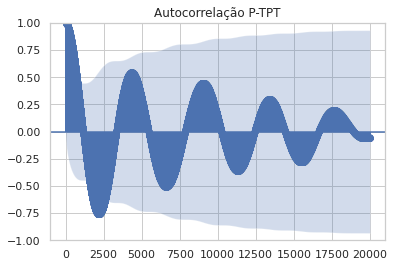

In [26]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_normal['P-TPT'], lags = 20000)
plt.title("Autocorrelação {}".format('P-TPT'))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

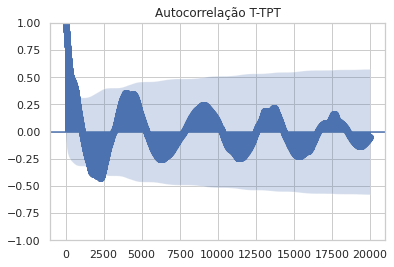

In [27]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_normal['T-TPT'], lags = 20000)
plt.title("Autocorrelação {}".format('T-TPT'))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

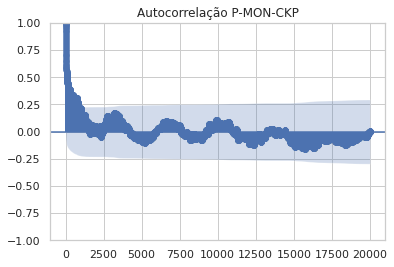

In [28]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_normal['P-MON-CKP'], lags = 20000)
plt.title("Autocorrelação {}".format('P-MON-CKP'))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

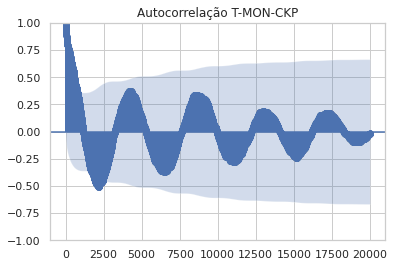

In [29]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_normal['T-JUS-CKP'], lags = 20000)
plt.title("Autocorrelação {}".format('T-MON-CKP'))
plt.show

### Autocorrelação para os dados de poços em falha

<function matplotlib.pyplot.show(close=None, block=None)>

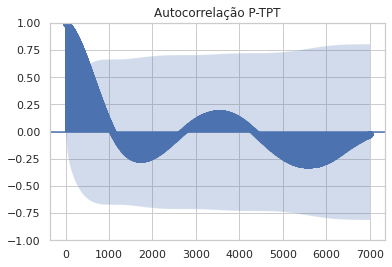

In [30]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_falha['P-TPT'], lags = 7000)
plt.title("Autocorrelação {}".format('P-TPT'))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

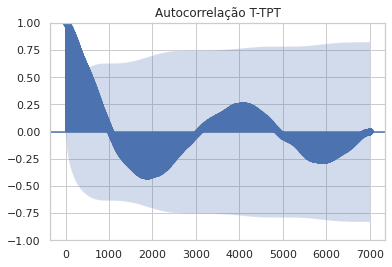

In [31]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_falha['T-TPT'], lags = 7000)
plt.title("Autocorrelação {}".format('T-TPT'))
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

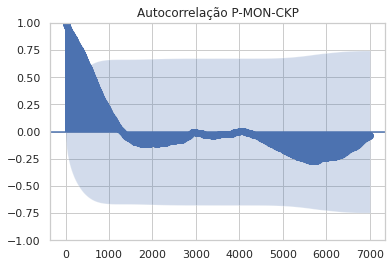

In [32]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_falha['P-MON-CKP'], lags = 7000)
plt.title("Autocorrelação {}".format('P-MON-CKP'))
plt.show

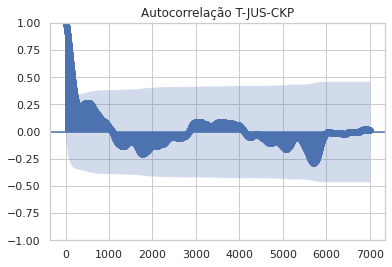

In [33]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(poco_01_falha['T-JUS-CKP'], lags = 7000)
plt.title("Autocorrelação {}".format('T-JUS-CKP'))
plt.show()

/opt/conda/lib/python3.7/site-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


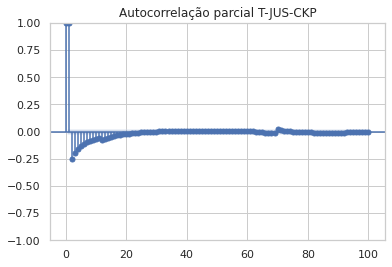

In [34]:
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(poco_01_falha['T-JUS-CKP'], lags = 100)
plt.title("Autocorrelação parcial {}".format('T-JUS-CKP'))
plt.show()

### Visualização dos dados

In [35]:
def plot_faulty_instances(n_rows, n_cols, figsize,data_type='WELL', graphs_per_plot = 100, subset = 1):
    
    fig = plt.figure(constrained_layout=True, figsize=figsize)
    subfigs = fig.subfigures(n_rows, n_cols, wspace=0.07)

    title = {'SIMULATED': 'Simulation',
             'DRAWN': 'Drawn data',
             'WELL': 'Well'}
    
    rotulos = ['P-PDG','P-TPT','T-TPT','P-MON-CKP',
           'T-JUS-CKP','P-JUS-CKGL','T-JUS-CKGL','QGL']

    if data_type == 'SIMULATED' or data_type == 'DRAWN':
        slice_number = slice(-5,None)
    elif data_type == 'WELL':
        slice_number = slice(5,10)

    j=0
    
    for key in sorted(dfs.keys()):
        
        if j+1<=((subset-1)*100):
            j+=1
            continue
        if j == subset*graphs_per_plot:
            break
            
        if data_type not in key:
            continue

        df_plot = dfs[key]

        ax = subfigs.ravel()[j-(subset-1)*100].subplots(8, 1, sharex=True)

        for i in range(8):
            ax[i].plot(df_plot.index,df_plot.iloc[:,i],c='k',linewidth=0.8)
            ax[i].set_ylabel("{}".format(rotulos[i]),loc="top", rotation=0,fontsize=14)
            ax[i].set_yticks([])
            ax[i].spines["top"].set_visible(False)
            ax[i].spines["right"].set_visible(False)
            ax[i].spines["left"].set_visible(False)
            ax[i].fill_between(df_plot.index, ax[i].get_ylim()[0], ax[i].get_ylim()[1],
                                where=(df_plot['class']==(EVENT+100)), 
                                alpha=0.2,color='red')
            ax[i].fill_between(df_plot.index,ax[i].get_ylim()[0], ax[i].get_ylim()[1],
                                where=(df_plot['class']==EVENT), 
                                alpha=0.6,color='red')
            ax[i].set_xticks([])
            ax[i].spines["bottom"].set_visible(False)
            ax[i].xaxis.set_ticks_position('none')
        
        title_str = title[data_type]+f' {int(key[slice_number])}'
        if data_type == 'WELL':
            title_str = title_str + f'\n {df_plot.index[0]} to {df_plot.index[-1]}'
        ax[0].set_title(title_str)
        
        gc.collect()

        j+=1

CPU times: user 1min 19s, sys: 1.29 s, total: 1min 20s
Wall time: 1min 20s


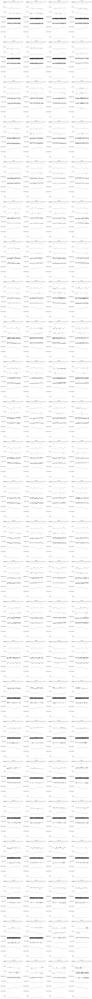

In [36]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL')

CPU times: user 1min 20s, sys: 362 ms, total: 1min 20s
Wall time: 1min 21s


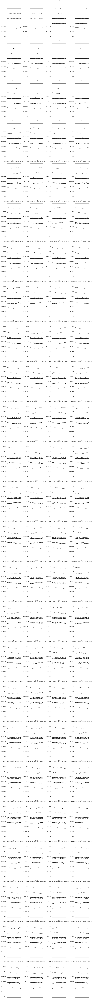

In [37]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL',subset=2)

CPU times: user 1min 21s, sys: 126 ms, total: 1min 21s
Wall time: 1min 21s


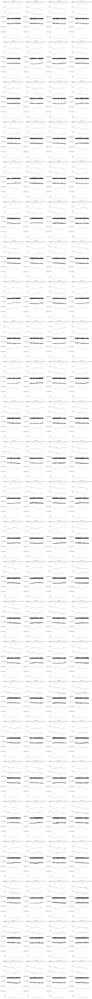

In [38]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL',subset=3)

CPU times: user 1min 22s, sys: 92.1 ms, total: 1min 22s
Wall time: 1min 22s


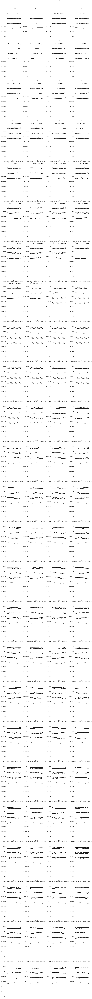

In [39]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL',subset=4)

Percebe-se que existe uma grande quantidade de **dados faltantes**, em especial para as variáveis **'P-JUS-CKGL','T-JUS-CKGL' e 'QGL'** em especial para o **Poço 4**. Além disso o banco aprensenta uma grande quantidade de **valores congelados** para a variável **P-PDG** para os **Poços 1, 2, 4 e 5.**
Nos dados do **Poço 10** é identificado uma grande quantidade de ruído na variável **P- TPT**.

Em qualidade geral dos dados por poço, os melhores dados são do **Poço 14**, pois a única variável sem registro é a **'T-JUS-CKGL'**, entretanto todas as demais variável foram registradas e não apresentam ruído, valores faltantes ou valores congelados.

## Verificando a distribuição das classes

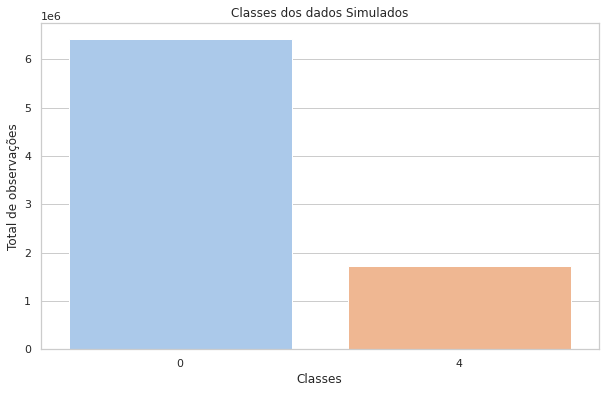

In [40]:
plt.figure(figsize = (10,6))
sns.countplot(x=dados_total_2['class'], palette = "pastel")
plt.title("Classes dos dados Simulados")
plt.xlabel('Classes', fontsize = 12)
plt.ylabel('Total de observações', fontsize = 12)
plt.show()

Tem-se muito mais dados da **classe "0" (estado normal)**.

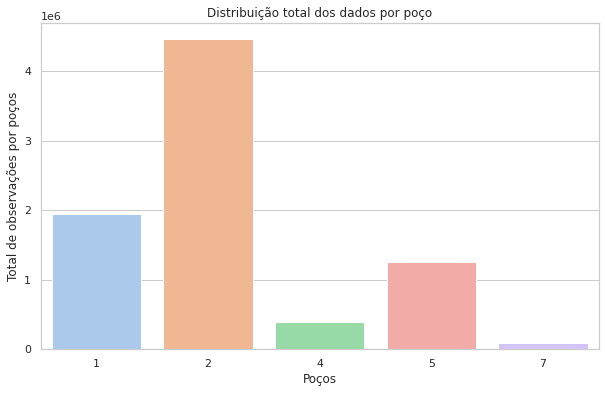

In [41]:
plt.figure(figsize = (10,6))
sns.countplot(x = 'Id_poco', data = dados_total_2, palette = "pastel")
plt.title("Distribuição total dos dados por poço")
plt.xlabel('Poços', fontsize = 12)
plt.ylabel('Total de observações por poços', fontsize = 12)
plt.show()

## Preparando o conjunto de dados para treinamento dos modelos

In [42]:
dados_total_2['class'].replace(4, 1, inplace = True)
dados_total_2

,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,class,Id_poco
timestamp,,,,,,,
2014-08-07 16:03:11,0.0,17734130.0,106.4384,9527408.0,68.04015,0,4
2014-08-07 16:03:12,0.0,17734340.0,106.4384,9524757.0,68.02015,0,4
2014-08-07 16:03:13,0.0,17734550.0,106.4384,9522105.0,68.00014,0,4
2014-08-07 16:03:14,0.0,17734760.0,106.4384,9519454.0,67.98015,0,4
2014-08-07 16:03:15,0.0,17734970.0,106.4384,9516803.0,67.96014,0,4
...,...,...,...,...,...,...,...
2017-06-25 07:59:56,0.0,20772740.0,106.0728,11853160.0,66.77367,1,5
2017-06-25 07:59:57,0.0,20772160.0,106.0818,11857100.0,66.78676,1,5
2017-06-25 07:59:58,0.0,20771590.0,106.0908,11861040.0,66.79985,1,5


Utilizando o ID dos poços para separ os bancos de dados e evitar o Víes de similaridade na predição.

In [43]:
pocos = dados_total_2['Id_poco']

In [44]:
X = dados_total_2.iloc[:,:-2]
y = dados_total_2.iloc[:,-2]

In [45]:
y.value_counts()/y.shape[0]

0    0.788972
1    0.211028
Name: class, dtype: float64

# Modelo de Florestas Aleatórias

In [46]:
%%time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
classificador = RandomForestClassifier(max_features = 0.5, min_samples_leaf = 3, n_estimators = 50, 
                                       criterion= 'entropy', max_samples = 1000,
                                       random_state = 0).fit(X_train, y_train)
X_test = sc.transform(X_test)
classificador.score(X_test, y_test)

CPU times: user 36.5 s, sys: 6.62 s, total: 43.1 s
Wall time: 43.6 s


0.9798343614296302

In [47]:
%%time
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score
classificador = make_pipeline(StandardScaler(), RandomForestClassifier(max_features = 0.5, min_samples_leaf = 3, n_estimators = 50, 
                                       criterion= 'entropy', max_samples = 1000,
                                       random_state = 0))

acuracia = []
recall = []
precision = []
groups = pocos
gkf = GroupKFold(n_splits = 5)
gkf.split(X, y, pocos)

for train, test in gkf.split(X, y, pocos):
    print("%s %s" %(train, test))
    X_train, X_test = X.iloc[train], X.iloc[test]
    y_train, y_test = y.iloc[train], y.iloc[test]
    print(f"Poço utilizado para validar: {groups[test][0]}")
    
    classificador.fit(X_train,y_train)
    y_pred = classificador.predict(X_test)
    acuracia.append(accuracy_score(y_pred, y_test))
    #recal = (recall_score(y_pred, y_test, average="binary", pos_label="pos"))
    recall.append(recall_score(y_pred, y_test))
    precision.append(precision_score(y_pred, y_test))
    
print('\n Métricas Validação- Cruzada para os 5 k-fols:')
print('\n Acurácia:', acuracia)
print('\n Recall:', recall)
print('\n Precisão:', precision)

[      0       1       2 ... 8145040 8145041 8145042] [  38880   38881   38882 ... 8137902 8137903 8137904]
Poço utilizado para validar: 2
[      0       1       2 ... 8145040 8145041 8145042] [  17721   17722   17723 ... 8081400 8081401 8081402]
Poço utilizado para validar: 1
[      0       1       2 ... 8137902 8137903 8137904] [   7010    7011    7012 ... 8145040 8145041 8145042]
Poço utilizado para validar: 5
[   7010    7011    7012 ... 8145040 8145041 8145042] [      0       1       2 ... 8130726 8130727 8130728]
Poço utilizado para validar: 4
[      0       1       2 ... 8145040 8145041 8145042] [1954671 1954672 1954673 ... 8116523 8116524 8116525]
Poço utilizado para validar: 7

 Métricas Validação- Cruzada para os 5 k-fols:

 Acurácia: [0.9060117859189191, 0.43689873145030744, 0.21701970181511834, 0.24233258695175383, 0.16705223143185965]

 Recall: [0.9011271562111499, 0.19234750366918146, 0.21701970181511834, 0.9935691318327974, 0.0]

 Precisão: [0.5394136460950395, 1.0, 1.0,

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [48]:
from statistics import mean, stdev
avg = mean(acuracia)
std = stdev(acuracia)
avg, std

(0.39386300751359166, 0.30406684956997326)

# Modelo de Redes Neurais Artificiais

In [49]:
%%time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)

ANN = Sequential(
    [               
        tf.keras.Input(shape=(5,)),    #specify input size
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(1, activation="sigmoid")
    ], name = "my_model")

ANN.compile(loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(0.001), metrics=[tf.keras.metrics.BinaryAccuracy()])

ANN.fit(X_train, y_train, batch_size = 570153, epochs = 100)

X_test = sc.transform(X_test)
y_pred_2 = ANN.predict(X_test)
y_pred_2 = (y_pred_2 > 0.5)

Epoch 1/100
10/10 [==============================] - 3s 49ms/step - loss: 0.6224 - binary_accuracy: 0.8285
Epoch 2/100
10/10 [==============================] - 1s 66ms/step - loss: 0.5412 - binary_accuracy: 0.8889
Epoch 3/100
10/10 [==============================] - 1s 64ms/step - loss: 0.4689 - binary_accuracy: 0.9012
Epoch 4/100
10/10 [==============================] - 1s 63ms/step - loss: 0.3938 - binary_accuracy: 0.9008
Epoch 5/100
10/10 [==============================] - 1s 41ms/step - loss: 0.3256 - binary_accuracy: 0.9008
Epoch 6/100
10/10 [==============================] - 1s 45ms/step - loss: 0.2768 - binary_accuracy: 0.9008
Epoch 7/100
10/10 [==============================] - 1s 57ms/step - loss: 0.2473 - binary_accuracy: 0.9008
Epoch 8/100
10/10 [==============================] - 1s 65ms/step - loss: 0.2316 - binary_accuracy: 0.9008
Epoch 9/100
10/10 [==============================] - 1s 61ms/step - loss: 0.2234 - binary_accuracy: 0.9008
Epoch 10/100
10/10 [=================

In [50]:
from sklearn.metrics import confusion_matrix, accuracy_score

cm = confusion_matrix(y_test, y_pred_2)
print(cm)
accuracy_score(y_test, y_pred_2)

[[1884500   43094]
 [ 125892  390027]]


0.9308430116803144

In [51]:
%%time
from sklearn.model_selection import GroupKFold
#from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

ANN = Sequential(
    [               
        tf.keras.Input(shape=(5,)),    #specify input size
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(1, activation="sigmoid")
    ], name = "my_model")

acuracia = []
recall = []
precision = []
groups = pocos
gkf = GroupKFold(n_splits = 5)
gkf.split(X, y, pocos)

for train, test in gkf.split(X, y, pocos):
    print("%s %s" %(train, test))
    X_train, X_test = X.iloc[train], X.iloc[test]
    y_train, y_test = y.iloc[train], y.iloc[test]
    print(f"Poço utilizado para validar: {groups[test][0]}")
    
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    
    
    ANN.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(0.01), metrics=[tf.keras.metrics.BinaryAccuracy()])
    ANN.fit(X_train, y_train, batch_size = 10000, epochs = 100)
    X_test = sc.transform(X_test)
    y_pred_2 = ANN.predict(X_test)
    y_pred_2 = (y_pred_2 > 0.5)
    
    acuracia.append(accuracy_score(y_pred_2, y_test))
    #recal = (recall_score(y_pred, y_test, average="binary", pos_label="pos"))
    recall.append(recall_score(y_pred_2, y_test))
    precision.append(precision_score(y_pred_2, y_test))
    
print('\n Métricas Validação- Cruzada para os 5 k-fols:')
print('\n Acurácia:', acuracia)
print('\n Recall:', recall)
print('\n Precisão:', precision)

print('\n Os poços avaliados são respectivamente 02, 01, 05, 04 e 07')

[      0       1       2 ... 8145040 8145041 8145042] [  38880   38881   38882 ... 8137902 8137903 8137904]
Poço utilizado para validar: 2
Epoch 1/100
368/368 [==============================] - 2s 4ms/step - loss: 0.2951 - binary_accuracy: 0.8734
Epoch 2/100
368/368 [==============================] - 1s 4ms/step - loss: 0.1334 - binary_accuracy: 0.9474
Epoch 3/100
368/368 [==============================] - 1s 4ms/step - loss: 0.1008 - binary_accuracy: 0.9556
Epoch 4/100
368/368 [==============================] - 1s 4ms/step - loss: 0.0947 - binary_accuracy: 0.9571
Epoch 5/100
368/368 [==============================] - 2s 5ms/step - loss: 0.0861 - binary_accuracy: 0.9614
Epoch 6/100
368/368 [==============================] - 1s 3ms/step - loss: 0.1300 - binary_accuracy: 0.9543
Epoch 7/100
368/368 [==============================] - 1s 4ms/step - loss: 0.1167 - binary_accuracy: 0.9536
Epoch 8/100
368/368 [==============================] - 1s 4ms/step - loss: 0.1003 - binary_accuracy: 0.95

In [52]:
from statistics import mean, stdev
avg = mean(acuracia)
std = stdev(acuracia)
avg, std

(0.654741938647573, 0.27100135872593933)